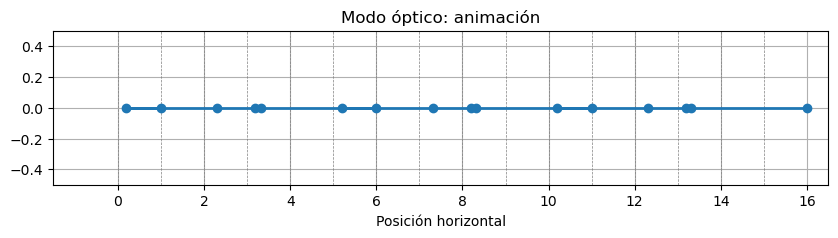

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Parámetros
a = 1.0              # Separación entre átomos
N = 8                # Número de pares de átomos
q = 0.2 * np.pi      # Número de onda (modo óptico)
omega = 0.2          # Frecuencia angular
A = 1.0              # Amplitud
T = 2 * np.pi / omega
times = np.linspace(0, T, 100)

# Posiciones de equilibrio
x_positions = np.array([n * a for n in range(2 * N)])
atom_types = ['M' if i % 2 == 0 else 'm' for i in range(2 * N)]

# Movimiento óptico: oposición de fase
optical_displacements = np.array([
    [A * np.cos(q * x - omega * t) if i % 2 == 0 else -A * np.cos(q * x - omega * t)
     for i, x in enumerate(x_positions)]
    for t in times
])

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(10, 2))
ax.set_xlim(min(x_positions) - 1.5, max(x_positions) + 1.5)
ax.set_ylim(-0.5, 0.5)
ax.set_xlabel("Posición horizontal")
ax.set_title("Modo óptico: animación")
ax.grid(True)

# Dibujar líneas de equilibrio
for x in x_positions:
    ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)

points, = ax.plot([], [], 'o-', lw=2)

# Función de inicialización
def init():
    points.set_data([], [])
    return points,

# Función de actualización
def update(frame):
    x = x_positions + optical_displacements[frame]
    y = np.zeros_like(x)
    points.set_data(x, y)
    return points,

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=len(times), init_func=init,
                              blit=True, interval=50)

# Mostrar la animación en un notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


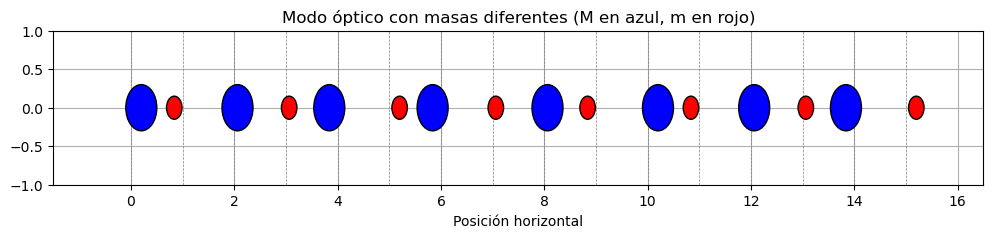

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.animation as animation

# Parámetros del sistema
a = 1.0              # Separación entre átomos
N = 8                # Número de pares de átomos
q = 0.2 * np.pi      # Número de onda
omega = 0.2          # Frecuencia angular
A = 0.2              # Amplitud (pequeña para evitar cruce visual)
T = 2 * np.pi / omega
times = np.linspace(0, T, 100)

# Posiciones de equilibrio
x_positions = np.array([n * a for n in range(2 * N)])

# Movimiento modo óptico: en oposición de fase
optical_displacements = np.array([
    [A * np.cos(q * x - omega * t) if i % 2 == 0 else -A * np.cos(q * x - omega * t)
     for i, x in enumerate(x_positions)]
    for t in times
])

# Crear la figura
fig, ax = plt.subplots(figsize=(12, 2))
ax.set_xlim(min(x_positions) - 1.5, max(x_positions) + 1.5)
ax.set_ylim(-1, 1)
ax.set_xlabel("Posición horizontal")
ax.set_title("Modo óptico con masas diferentes (M en azul, m en rojo)")
ax.grid(True)

# Líneas de equilibrio
for x in x_positions:
    ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)

# Crear círculos para los átomos
atom_circles = []
for i, x in enumerate(x_positions):
    if i % 2 == 0:  # masa M
        circle = patches.Circle((x, 0), 0.3, fc='blue', ec='black', zorder=2)
    else:           # masa m
        circle = patches.Circle((x, 0), 0.15, fc='red', ec='black', zorder=2)
    ax.add_patch(circle)
    atom_circles.append(circle)

# Función de actualización para la animación
def update(frame):
    disp = optical_displacements[frame]
    for i, circle in enumerate(atom_circles):
        new_x = x_positions[i] + disp[i]
        circle.center = (new_x, 0)
    return atom_circles

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=len(times), interval=50, blit=True)

# Mostrar animación si estás en un notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


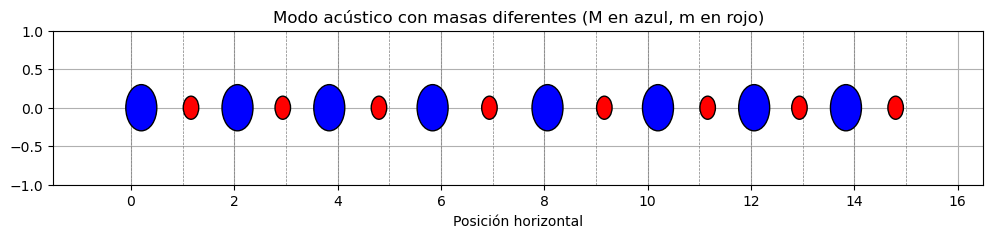

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.animation as animation

# Parámetros del sistema
a = 1.0              # Separación entre átomos
N = 8                # Número de pares de átomos
q = 0.2 * np.pi      # Número de onda
omega = 0.2          # Frecuencia angular
A = 0.2              # Amplitud (pequeña para claridad)
T = 2 * np.pi / omega
times = np.linspace(0, T, 100)

# Posiciones de equilibrio
x_positions = np.array([n * a for n in range(2 * N)])

# Movimiento modo acústico: todos en fase
acoustic_displacements = np.array([
    [A * np.cos(q * x - omega * t) for x in x_positions]
    for t in times
])

# Crear figura
fig, ax = plt.subplots(figsize=(12, 2))
ax.set_xlim(min(x_positions) - 1.5, max(x_positions) + 1.5)
ax.set_ylim(-1, 1)
ax.set_xlabel("Posición horizontal")
ax.set_title("Modo acústico con masas diferentes (M en azul, m en rojo)")
ax.grid(True)

# Líneas de equilibrio
for x in x_positions:
    ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)

# Círculos para átomos
atom_circles = []
for i, x in enumerate(x_positions):
    if i % 2 == 0:  # Masa M
        circle = patches.Circle((x, 0), 0.3, fc='blue', ec='black', zorder=2)
    else:           # Masa m
        circle = patches.Circle((x, 0), 0.15, fc='red', ec='black', zorder=2)
    ax.add_patch(circle)
    atom_circles.append(circle)

# Función de actualización
def update(frame):
    disp = acoustic_displacements[frame]
    for i, circle in enumerate(atom_circles):
        new_x = x_positions[i] + disp[i]
        circle.center = (new_x, 0)
    return atom_circles

# Crear animación
ani = animation.FuncAnimation(fig, update, frames=len(times), interval=50, blit=True)

# Mostrar en notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


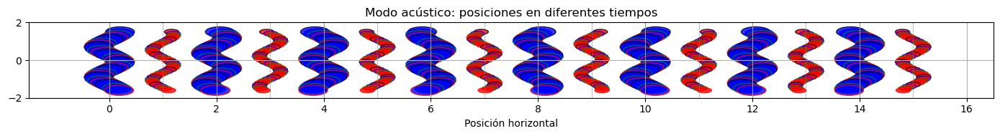

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Parámetros del sistema
a = 1.0              # Separación entre átomos
N = 8                # Número de pares de átomos
q = 0.2 * np.pi      # Número de onda
omega = 0.2          # Frecuencia angular
A = 0.2              # Amplitud de oscilación

# Tiempos seleccionados
T = 2 * np.pi / omega
times = [i*T/16 for i in range(32)]
colors = ['black', 'blue', 'green', 'red'] 

# Posiciones de equilibrio
x_positions = np.array([n * a for n in range(2 * N)])

# Crear figura
fig, ax = plt.subplots(figsize=(14, 2))
ax.set_xlim(min(x_positions) - 1.5, max(x_positions) + 1.5)
ax.set_ylim(-2, 2)
ax.set_xlabel("Posición horizontal")
ax.set_title("Modo acústico: posiciones en diferentes tiempos")
ax.grid(True)

# Líneas de equilibrio
for x in x_positions:
    ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)

# Dibujar los átomos en cada tiempo
for idx, t in enumerate(times):
    displacements = [A * np.cos(q * x - omega * t) for x in x_positions]
    for i, x0 in enumerate(x_positions):
        x_disp = x0 + displacements[i]
        radius = 0.3 if i % 2 == 0 else 0.15
        color_fill = 'blue' if i % 2 == 0 else 'red'
        circle = patches.Circle((x_disp, 1.5 - idx * 0.1), radius * 0.9,
                                fc=color_fill, ec=colors[idx % len(colors)], alpha=0.8)
        ax.add_patch(circle)

# Añadir leyenda
handles = [patches.Patch(edgecolor=colors[i % len(colors)], facecolor='none', label=f'Tiempo {i+1}') for i in range(len(times))]
#ax.legend(handles=handles, loc='upper right')

plt.tight_layout()
plt.show()


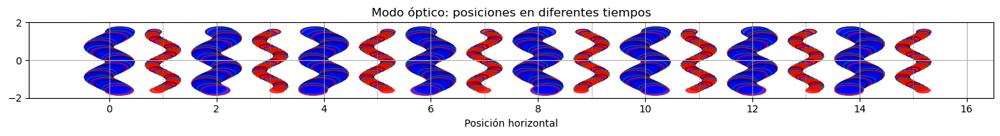

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Parámetros del sistema
a = 1.0              # Separación entre átomos
N = 8                # Número de pares de átomos
q = 0.2 * np.pi      # Número de onda
omega = 0.2          # Frecuencia angular
A = 0.2              # Amplitud de oscilación

# Tiempos seleccionados
T = 2 * np.pi / omega
times = [i*T/16 for i in range(32)]
colors = ['black', 'blue', 'green', 'red']

# Posiciones de equilibrio
x_positions = np.array([n * a for n in range(2 * N)])

# Crear figura
fig, ax = plt.subplots(figsize=(14, 2))
ax.set_xlim(min(x_positions) - 1.5, max(x_positions) + 1.5)
ax.set_ylim(-2, 2)
ax.set_xlabel("Posición horizontal")
ax.set_title("Modo óptico: posiciones en diferentes tiempos")
ax.grid(True)

# Líneas de equilibrio
for x in x_positions:
    ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)

# Dibujar los átomos en cada tiempo
for idx, t in enumerate(times):
    displacements = []
    for i, x in enumerate(x_positions):
        if i % 2 == 0:
            disp =  A * np.cos(q * x - omega * t)  # Masa M
        else:
            disp = -A * np.cos(q * x - omega * t)  # Masa m, oposición de fase
        displacements.append(disp)

    for i, x0 in enumerate(x_positions):
        x_disp = x0 + displacements[i]
        radius = 0.3 if i % 2 == 0 else 0.15
        color_fill = 'blue' if i % 2 == 0 else 'red'
        circle = patches.Circle((x_disp, 1.5 - idx * 0.1), radius * 0.9,
                                fc=color_fill, ec=colors[idx % len(colors)], alpha=0.8)
        ax.add_patch(circle)

# Añadir leyenda
handles = [patches.Patch(edgecolor=colors[i % len(colors)], facecolor='none', label=f'Tiempo {i+1}') for i in range(len(times))]
#ax.legend(handles=handles, loc='upper right')

plt.tight_layout()
plt.show()
